<a href="https://colab.research.google.com/github/zuvelatamara/PPPO-2025/blob/main/PPPO_V1_Uvod_u_obradu_slika_u_python.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

#**Uvod u obradu slika u Python-u**


>Uvod u osnovne tehnike obrade slika korišćenjem biblioteke za računarski vid OpenCV i nekih standardnih biblioteka u Pajtonu.


*Korisni uvod o [Colab](https://colab.research.google.com/notebooks/welcome.ipynb)*

*Korisni uvod o [OpenCV](https://opencv.org/)*







<h1>Šta je Colaboratory?</h1>

Colaboratory, ili skraćeno „Colab“, vam omogućava da pišete i izvršavate Pajton u svom pregledaču.
Prednosti:
- Nije potrebna nikakva konfiguracija
- Besplatan pristup grafičkim procesorima
- Jednostavno deljenje




# Osnove Python-a
Pajton ima moćne biblioteke koje vam pomažu u kreiranju koda. Koristi se <b>import</b> kako bi učitali biblioteku.

Neke od biblioteka koje ćemo koristiti su: **numpy**, **pandas**, **cv2**, **skimage**, **matplotlib**

* [Numpy](https://www.numpy.org/) je biblioteka za manipulaciju nizovima, koja se koristi za linearnu algebru, Furijeovu transformaciju i mogućnosti slučajnih brojeva.
* [Pandas](https://pandas.pydata.org/) je biblioteka za manipulaciju podacima i analizu podataka.
* [CV2](https://opencv-python-tutroals.readthedocs.io/en/latest/py_tutorials/py_gui/py_image_display/py_image_display.html) je biblioteka za zadatke računarskog vida.
* [Skimage](https://scikit-image.org/) je biblioteka koja podržava aplikacije za obradu slika na Pajtonu.
* [Matplotlib](https://matplotlib.org/) je biblioteka koja generiše slike i pruža grafički korisnički interfejs.

In [ ]:
import numpy as np
import pandas as pd
import cv2 as cv
from google.colab.patches import cv2_imshow # za prikazivanje slika
from skimage import io
from PIL import Image
import matplotlib.pylab as plt

##Čitanje slike iz URL adresa

> U ovom koraku ćemo čitati slike sa URL-ova i prikazivati ih koristeći openCV.

>Obratite pažnju na razliku prilikom čitanja slike u RGB i BGR formatu. Podrazumevani ulazni kanali boja su u BGR formatu za openCV.

OpenCV podrazumevano koristi format BGR (plavi–zeleni–crveni), dok biblioteka Matplotlib koristi RGB (crveni–zeleni–plavi).
Zbog toga se pri prikazu slike u Matplotlib-u radi konverzija između ova dva formata, jer bi se inače boje prikazale pogrešno (crveno i plavo bi bile zamenjene).
Važno je zapamtiti da je ovo vizuelna razlika, dok su stvarne numeričke vrednosti piksela identične.
| Biblioteka               | Format koji koristi BGR?            |
| ------------------------ | ------------------- |
| scikit-image (`skimage`) |   RGB                                                 |
| matplotlib               |  RGB                                            |
| OpenCV (`cv2`)           |  BGR             

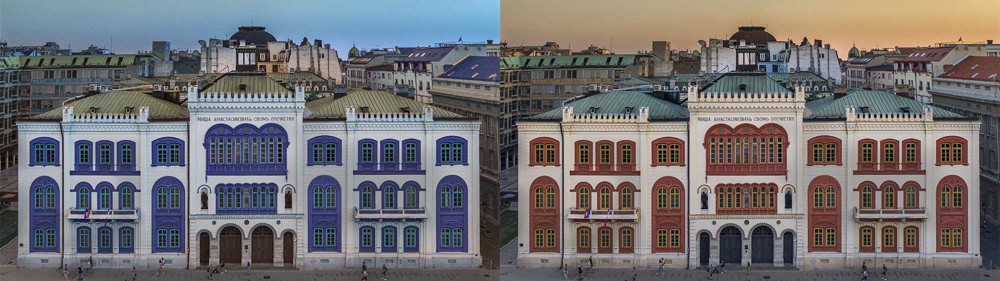

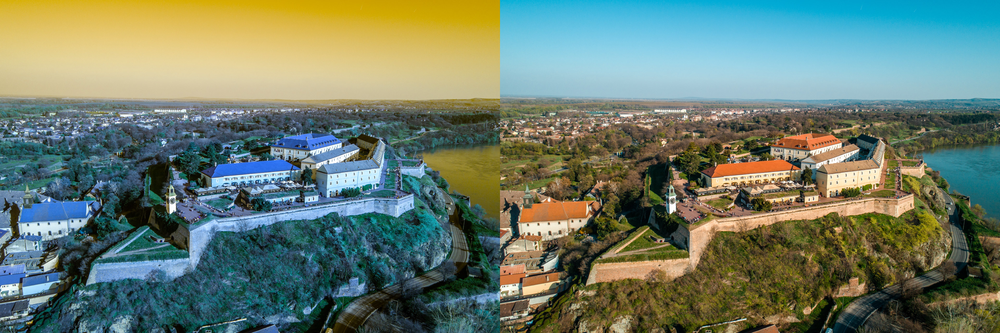

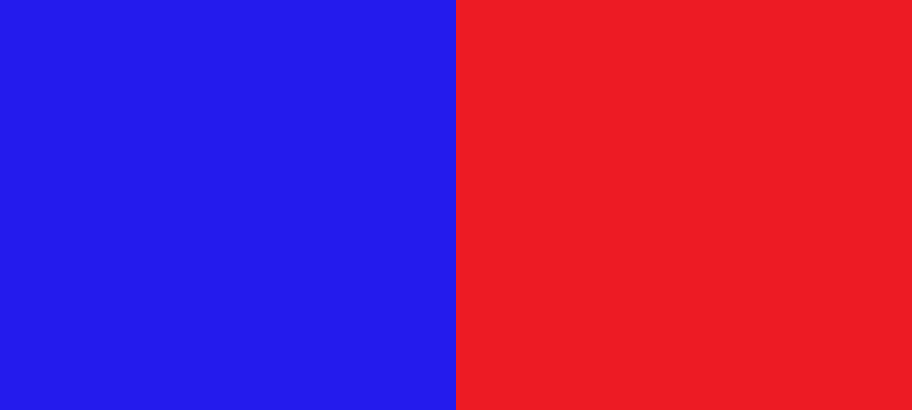

In [ ]:
# Kreiramo listu URL-ova slika
urls = ["https://ifdt.bg.ac.rs/wp-content/uploads/2025/01/university-of-belgrade.jpg",
        "https://www.exitfest.org/wp-content/uploads/2020/07/DJI_0093-1.jpg",
        "https://github.com/gonzo1978/CAP4453/blob/main/imgs/red.jpg?raw=true"]

# Čitamo i prikazujemo slike
# Petlja kroja prolazi kroz sve URL-ove iz liste

for url in urls:
  image = io.imread(url)   #io.imread čita u Brg formatu. Ako bismo koristili OpenCV Native čitanje, čitanje sa je već BGR i sledeća konverzija ne bi bila potrebna.
  image_2 = cv.cvtColor(image, cv.COLOR_BGR2RGB)
  final_frame = cv.hconcat((image, image_2))
  cv2_imshow(final_frame)
  print('\n')

## Šta je digitalna slika
- Slika je **mreža piksela**. U memoriji: 3D matrica oblika **(H, W, C)**
  - **H** = visina (broj redova), **W** = širina (broj kolona), **C** = broj kanala boja
  - RGB ima **3 kanala** (Red, Green, Blue)
- **dtype** (tip podataka) određuje opseg vrednosti:
  - `uint8` → celobrojno 0–255 (najčešće za slike na disku)
  - `float32` → realno 0–1 (često u treniranju modela)

Pravimo **sintetičku** RGB sliku (da notebook radi i bez fajlova na disku):

shape: (120, 180, 3) | dtype: uint8


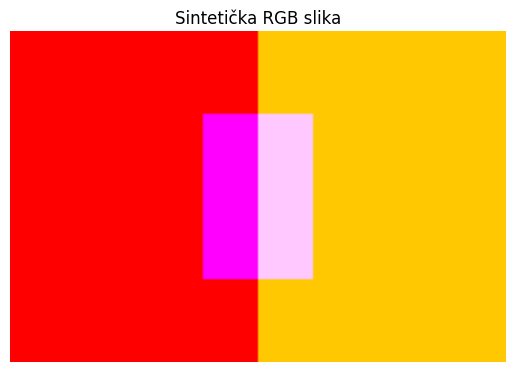

In [ ]:
# Napravi *praznu* sliku dimenzija 120x180 sa 3 kanala (sve nule = crno)
H, W = 120, 180
img_tst = np.zeros((H, W, 3), dtype=np.uint8)

# Postavi ceo R (0. kanal) na 255 → slika postaje crvenkasta
img_tst[..., 0] = 255

# Desna polovina dobija zelenu komponentu (1. kanal)
img_tst[:, W//2:, 1] = 200

# Dodaj plavi pravougaonik (2. kanal)
img_tst[30:90, 70:110, 2] = 255

print('shape:', img_tst.shape, '| dtype:', img_tst.dtype)
plt.imshow(img_tst); plt.title('Sintetička RGB slika'); plt.axis('off'); plt.show()

# Učitavanje slike i transformacija prostora boja

In [ ]:
# Učitavanje slike sa diska. U Colab-u: Files → Upload → npr. 'example.jpg'
path = 'images/example.jpg'  # ← promeni ime ako si upload-ovao fajl sa drugim nazivom
img_bgr = cv.imread(path)

# Fallback: ako fajl ne postoji, koristimo našu sintetički kreiranu sliku (prebacujemo je u BGR)
if img_bgr is None:
    img_bgr = cv.cvtColor(img_tst, cv.COLOR_RGB2BGR)

### RGB - Grayscale

Kod pretvaranja slike iz RGB u grayscale, svaka boja se svodi na jednu vrednost intenziteta svetlosti (od 0 do 255).
Crna boja ima vrednost 0, a bela 255.
Pretvaranje se vrši kombinovanjem R, G i B kanala prema njihovom doprinosu ukupnoj svetlini — najviše učestvuje zeleni kanal, jer je ljudsko oko najosetljivije na njega.
Ovaj prikaz se koristi kada boja nije važna, već samo struktura slike, ivice i kontrasti (npr. u detekciji ivica i segmentaciji).

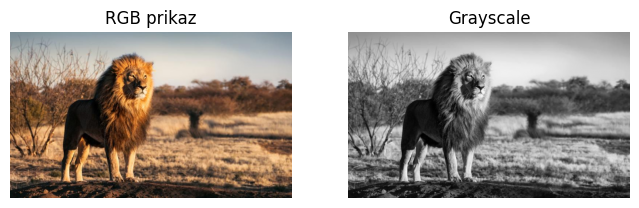

RGB shape: (453, 770, 3) | dtype: uint8
GRAY shape: (453, 770) | dtype: uint8


In [ ]:
#Konverzije u RGB (za prikaz) i GRAY (za analizu osvetljenja)
img_rgb_real = cv.cvtColor(img_bgr, cv.COLOR_BGR2RGB)  # BGR → RGB
img_gray     = cv.cvtColor(img_bgr, cv.COLOR_BGR2GRAY) # BGR → GRAY (1 kanal)

# 4) Prikaži jedan do drugog
fig, axs = plt.subplots(1, 2, figsize=(8,4))
axs[0].imshow(img_rgb_real)
axs[0].set_title('RGB prikaz')
axs[0].axis('off')

axs[1].imshow(img_gray, cmap='gray')
axs[1].set_title('Grayscale')
axs[1].axis('off')
plt.show()

print('RGB shape:', img_rgb_real.shape, '| dtype:', img_rgb_real.dtype)
print('GRAY shape:', img_gray.shape, '| dtype:', img_gray.dtype)

### RGB u Lab prostor boja

CIELAB prostor boja (skraćeno Lab) sastoji se od tri kanala:

L – svetlina (osvetljenost slike),

a – komponenta crveno ↔ zeleno,

b – komponenta žuto ↔ plavo.

Ovaj model odvaja svetlinu od boje, što olakšava analizu i obradu slika (npr. promenu kontrasta ili izdvajanje boja).
Nezavisan je od uređaja i koristi se u profesionalnoj obradi slike jer pruža stabilnije rezultate od RGB-a pri promeni osvetljenja.

Funkcija rgb2lab() iz modula u boji scikit-image je korišćena za pretvaranje slike iz RGB-a u prostor boje Lab. Izmenjena slika u prostoru boja Lab je konvertovana nazad u RGB pomoću funkcije lab2rgb() iz modula u boji scikit-image.

Takodje mogu se koristiti i funkcije cv2.cvtColor(img, cv2.COLOR_BGR2Lab) za pretvaranje slike iz BGR/RGB u Lab i obrnuto pomoću cv2.COLOR_Lab2BGR.

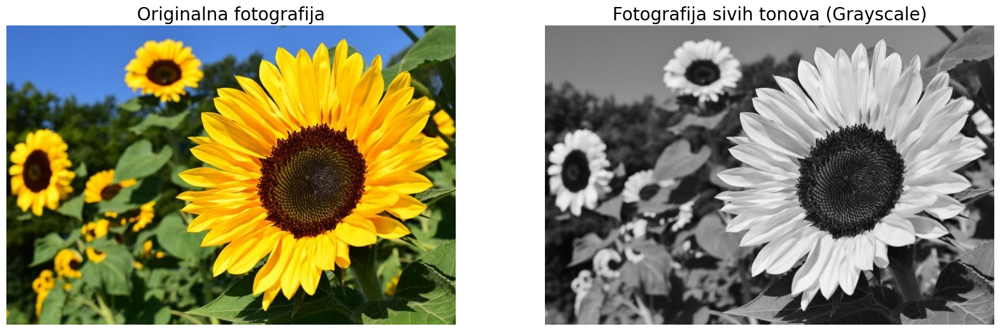

In [ ]:
# Učitavanje potrebnih bilblioteka
from skimage import img_as_float
from skimage.io import imread
from skimage.color import rgb2lab, lab2rgb
from skimage.util import invert
from skimage.exposure import equalize_hist
import matplotlib.pylab as plt

# 1. Učitavanje fotografije i transformacija iz RGB u Lab prostor boja
im = imread('images/flowers.jpeg')
im1 = rgb2lab(im)

# 2. Podešavanje vrednosti kanala (drugi i treći kanal) na nule
im1[...,1]  = im1[...,2] = 0

# 3. Transformacija fotografije nazad u RGB prostor boja i dolazak do fotografije sivih tonova
im1 = lab2rgb(im1)

# 4. Iscrtavanje ulazne i izlazne fotografije
plt.figure(figsize=(20,10))
plt.subplot(121), plt.imshow(im), plt.axis('off'), plt.title('Originalna fotografija', size=20)
plt.subplot(122), plt.imshow(im1), plt.axis('off'), plt.title('Fotografija sivih tonova (Grayscale)', size=20)
plt.show()

## Osnovne operacije (resize, normalizacija [0,1], blur)
- **Resize**: ujednači dimenzije (npr. 128×128) — važno za mreže i batch‑eve.
- **Normalizacija**: pretvori `uint8` u `float32` i podeli sa 255 → interval [0,1].
- **Blur**: blago zamućenje (Gaussian) umanjuje šum pre detekcije ivica/karakteristika.

**Napomena o kopijama:** Mnoge operacije kreiraju **nove** nizove, dok neka indeksiranja vraćaju **view** (zajedničku memoriju). Ako ne želiš da menjaš original, koristi `.copy()`.

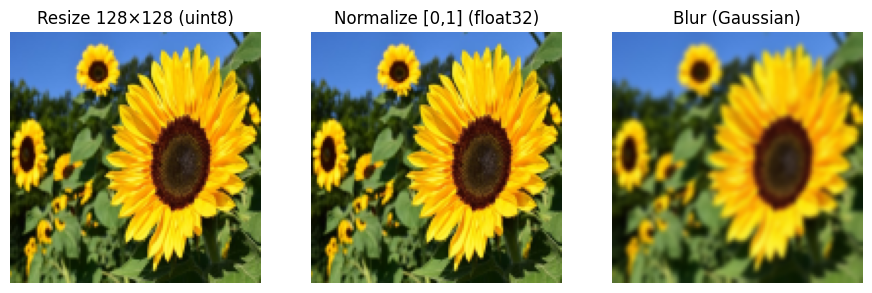

In [ ]:
# 128×128 je česta standardizovana veličina za primere
resized   = cv.resize(im, (128, 128), interpolation=cv.INTER_AREA)
# Pretvori u float32 i normalizuj u [0,1]
resized_f = resized.astype(np.float32) / 255.0
# Gaussian blur sa kernelom 5×5 i sigma automatski
blur      = cv.GaussianBlur(resized, (5,5), 0)

fig, axs = plt.subplots(1, 3, figsize=(11,4))
axs[0].imshow(resized);   axs[0].set_title('Resize 128×128 (uint8)'); axs[0].axis('off')
axs[1].imshow(resized_f); axs[1].set_title('Normalize [0,1] (float32)'); axs[1].axis('off')
axs[2].imshow(blur);      axs[2].set_title('Blur (Gaussian)'); axs[2].axis('off')
plt.show()

> **Interpolation hint:** Za smanjivanje slike često je dobar `INTER_AREA`; za povećavanje probaj `INTER_LINEAR` ili `INTER_CUBIC` (kvalitet vs brzina).

---

# Afine transformacije

Affine transformacija je geometrijska transformacija koja čuva tačke, linije i ravni. Linije koje su paralelne pre transformacije ostaju paralelne nakon primene transformacije. Za svaki piksel x na slici, afinska transformacija može biti predstavljena preslikavanjem,

x | → Mx + b, gde je M linearna transformacija (matrica), a b je vektor nagiba.

To je ekvivalentno prevođenju, rotaciji, skaliranju, smicanju i simetriji na slici. Isto kao i transformacija krutog tela, ono može da održi paralelni i kolinearni odnos između linija. Odnosno, originalna paralelna ravna linija je i dalje paralelna nakon promene. Ali za razliku od krute transformacije tela, dužina između segmenata linija će se promeniti.

### Primer nekih transformacija
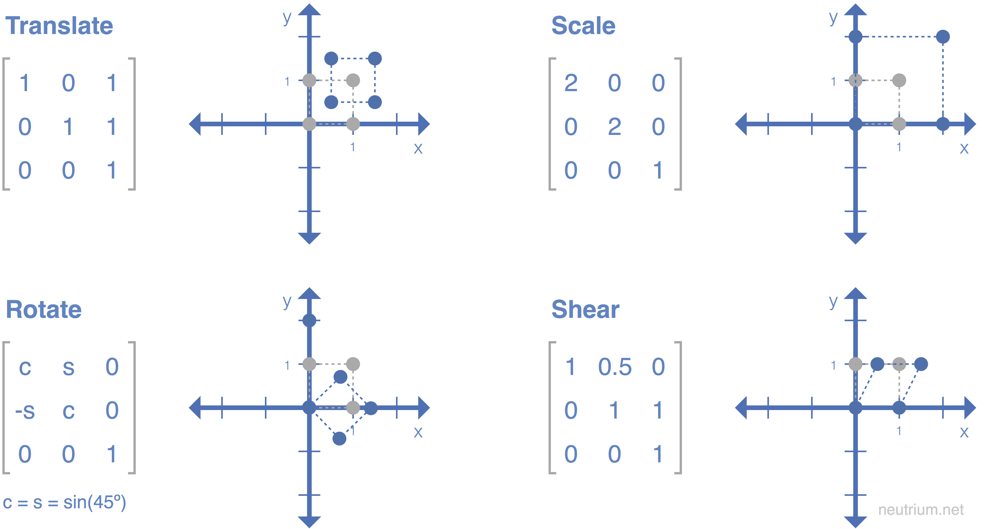

In [ ]:
# Gif primer nekih Afinih transformacija
from IPython.display import Image
Image(url='https://www.scilab.org/sites/default/files/affine-transform.gif')

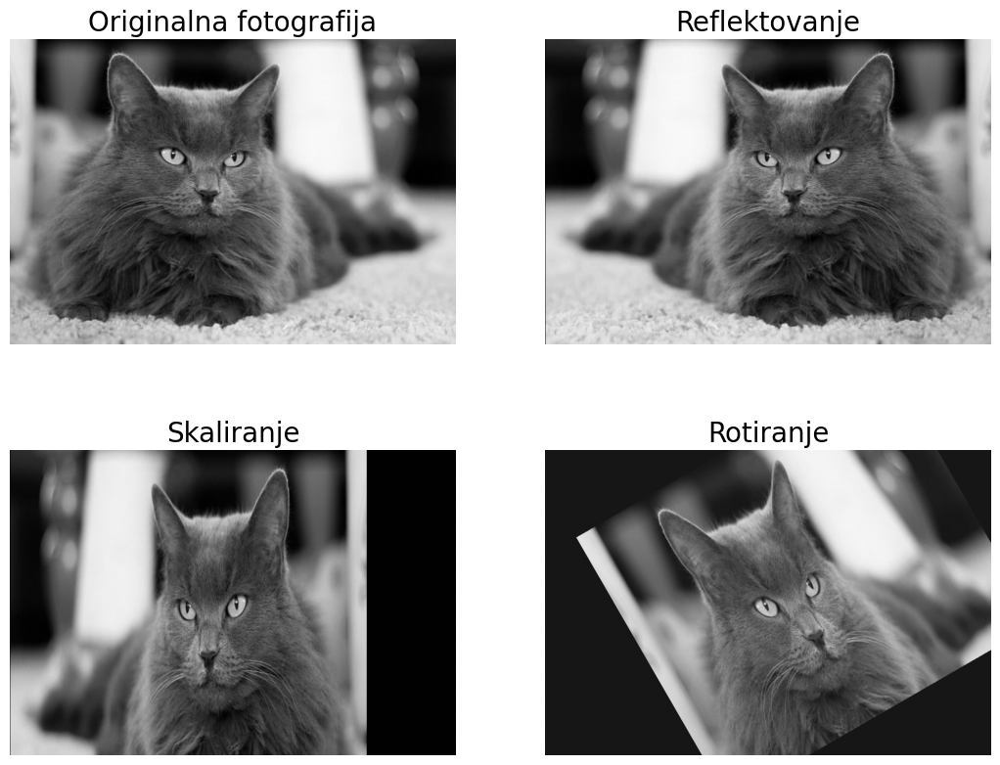

In [ ]:
# Učitavanje potrebnih bilblioteka
import numpy as np
from scipy import ndimage as ndi
from skimage.io import imread
from skimage.color import rgb2gray

# 1. Učitavanje ulazne fotografije, transformacija u sive tonove i uzimanje dimenzije fotografije.
img = imread('images/cat.jpg')
img = rgb2gray(img)
w, h = img.shape

plt.figure(figsize=(20,10))

# 2. Primena identity transformacije
# 1  0  0
# 0  1  0
# 0  0  1
mat_identity = np.array([[1,0,0],[0,1,0],[0,0,1]])
img1 = ndi.affine_transform(img, mat_identity)
plt.subplot(231), plt.imshow(img1, cmap='gray'), plt.axis('off'), plt.title('Originalna fotografija', size=20)

# 3. Primena refleksione simetrije (po x osi)
# 1  0  0
# 0 -1  0
# 0  0  1
mat_reflect = np.array([[1,0,0],[0,-1,0],[0,0,1]]) @ np.array([[1,0,0],[0,1,-h],[0,0,1]])
img1 = ndi.affine_transform(img1, mat_reflect) # offset=(0,h)
plt.subplot(232), plt.imshow(img1, cmap='gray'), plt.axis('off'), plt.title('Reflektovanje', size=20)

# 4. Skaliranje fotografije (0.75 puta duž x ose i 1.25 puta duž y ose)
# 0.75  0     0
# 0     1.25  0
# 0     0     1
mat_scale = np.array([[0.75,0,0],[0,1.25,0],[0,0,1]])
img1 = ndi.affine_transform(img1, mat_scale)
plt.subplot(234), plt.imshow(img1, cmap='gray'), plt.axis('off'), plt.title('Skaliranje', size=20)

# 5. Rotiranje fotografije za 30° u smeru suprotnom od kazaljke na satu.
# To je složena operacija - prvo je potrebno pomeriti/centrirati fotografiju, primeniti rotaciju, a zatim primeniti inverzni pomak
# θ
theta = np.pi/6
mat_rotate = np.array([[1,0,w/2],[0,1,h/2],[0,0,1]]) @ np.array([[np.cos(theta),np.sin(theta),0],[np.sin(theta),-np.cos(theta),0],[0,0,1]]) @ np.array([[1,0,-w/2],[0,1,-h/2],[0,0,1]])
img1 = ndi.affine_transform(img1, mat_rotate)
plt.subplot(235), plt.imshow(img1, cmap='gray'), plt.axis('off'), plt.title('Rotiranje', size=20)


# Iscrtavanje
plt.show()

## Brza analiza: proseci po kanalima + histogram osvetljenja
- **Proseci po kanalima (R,G,B)**: grub indikator „dominantne boje”.
- **Histogram grayscale**: raspodela tamno↔svetlo; **širok** histogram → kontrastna slika.


Proseci po kanalima  R:125.3  G:120.3  B:48.8


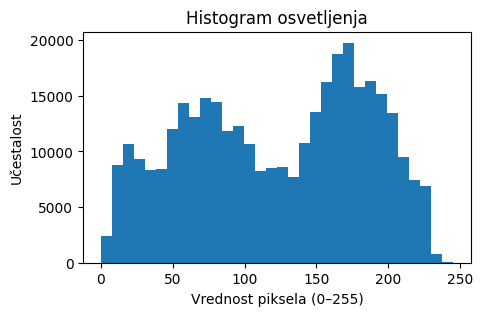

In [ ]:
# Računamo proseke po kanalima na resized (uint8) RGB slici
r_mean = im[..., 0].mean()
g_mean = im[..., 1].mean()
b_mean = im[..., 2].mean()
print(f'Proseci po kanalima  R:{r_mean:.1f}  G:{g_mean:.1f}  B:{b_mean:.1f}')

# Histogram grayscale osvetljenja
plt.figure(figsize=(5,3))
plt.hist(img_gray.ravel(), bins=32)
plt.title('Histogram osvetljenja')
plt.xlabel('Vrednost piksela (0–255)'); plt.ylabel('Učestalost')
plt.show()

Na slici iznad prikazana su dva tipa analize:

1.   Proseci po kanalima (R, G, B) – predstavljaju prosečnu vrednost intenziteta svake boje u slici:

* R (crveni kanal) ima prosečno 125.3,

* G (zeleni kanal) 120.3,

* B (plavi kanal) 48.8.

Ako su ove vrednosti slične, slika ima ujednačen ton; ako jedan kanal značajno odstupa, slika ima boju dominantu (npr. plavičastu ili crvenkastu nijansu).

2.  Histogram grayscale osvetljenja – prikazuje raspodelu svetlina svih piksela u slici:

* Osa x (vrednost piksela) označava intenzitet (0 = crno, 255 = belo),

* Osa y (učestalost) pokazuje koliko piksela ima određenu vrednost svetline.
Na primer, ako histogram ima vrhove u srednjem delu, znači da slika ima dosta srednjih tonova, dok histogram pomeren ka levoj strani znači tamnu sliku.

Ova analiza pomaže da razumemo osvetljenost i kontrast slike, što je važan korak u pripremi podataka pre primene algoritama prepoznavanja oblika.

---

## Snimanje fajlova (export) i alternativa sa matplotlib
- `cv2.imwrite('out.png', img_bgr)` očekuje **BGR**.
- Ako imate RGB u memoriji → prvo konvertujte nazad u BGR.
- Alternativa: `plt.imsave('out.png', img_rgb)` prihvata **RGB** i `float32 [0,1]`.


In [ ]:
# Snimanje preko OpenCV (BGR)
out_bgr = cv.cvtColor(resized, cv.COLOR_RGB2BGR)
cv.imwrite('output_resized.png', out_bgr)

# Snimanje preko matplotlib (RGB)
plt.imsave('output_normalized.png', resized_f)
print('Sačuvano: output_resized.png  i  output_normalized.png')

Sačuvano: output_resized.png  i  output_normalized.png


---

# Mini zadaci

### Zad.1 — Manipulacija slike
- Učitajte **neku** sliku, prikažite RGB i GRAY, ispišite `shape` i `dtype`.
- *Očekivanje:* treba da vidite dimenzije `(H,W,3)` i `(H,W)`.

### Zad.2 — Izdvajanje crvenog kanala
- Izdvojiti jedan kanal (npr. R) i prikazati ga.
- *Hint:* `img[...,0]...` itd. Pazite da ulaz nije GRAY.

### Zad 3 — Boje po kanalima i histogram osvetljenja
- Izračunati prosečnu vrednost boje po kanalima i kreirati histogram osvetljenja za odabranu sliku.

### Zad.4 — Flip i rotacija + histogram
- Napravite horizontalni **flip** (`img[:, ::-1, :]`) i rotaciju za **90°** (`np.rot90`).
- Nacrtajte histogram osvetljenja pre/posle i prokomentarišite promene.



In [ ]:
# Radni prostor za mini zadatke
# Zad.1:

# Zad.2:

# Zad.3:

# Zad.4:


# Kratka rekapitulacija
- Znaš da učitaš sliku, proveriš `shape` i `dtype` i prikažeš je pravilno (RGB vs BGR, Lab, Grayscale).
- Znaš osnovne pretproces korake: resize, normalizacija, blur i afine transformacije.
- Znaš da uradiš malu analizu: proseci po kanalima i histogram.
